## Nolan Roth

## Lissajous Figures

Lissajous curves describe complet harmonic motion in a system. They were studied in detail by Jules Lissajous in 1857, but found their most practical use on railroads in the late 1930s. The Chicago firefighter Jerry Kennelly mapped the movement of a halogen bulb to the pattern created by a 2D Lissajous figure, creating an oscillating light he dubbed a "Mars Light". Mars Lights became widely used by railroads and fire departments as a more effective means of catching the attention of pedestrians.

https://www.american-rails.com/mars.html

## Mars Light

In [5]:
from IPython.display import HTML
from base64 import b64encode


def video(fname, mimetype):
    """Load the video in the file `filename`, with given mimetype, and display as HTML5 video.
    """
    from IPython.display import HTML
    from base64 import b64encode
    
    with open(fname, "rb") as f: 
        video_encoded = b64encode(f.read()).decode("utf-8")

    video_tag= """
<center><video controls style='max-width:100%'>
<source src='data:{mimetype};base64,{b64}' type='video/{mimetype}' loop=1 autoplay=1>
Your browser does not support the video tag.
</video><center/>""".format(mimetype=mimetype, b64=video_encoded)
    return HTML(data=video_tag)

filename="mars.mp4"
video(filename, filename.split('.')[-1])


While Lissajous figures have found one use in Mars Lights, the theoretical foundation can be recreated using a simple oscillating system.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D as ax3
from mplEasyAnimate import animation
from tqdm import tqdm
import imageio as im

In [2]:
#You may need this download the first time you run the program. If not, don't worry about it!

#imageio.plugins.ffmpeg.download()

In [3]:
def spring(i0, t):
    didt = np.zeros(4) #initialize array; each element is a derivative of y [x,y,vx,vy]
    didt[0] = i0[2] # velocity; y[0] is position y[1] is dy/dt
    didt[1] = i0[3]
    #didt[2] = -k*(i0[0]**2+i0[1]**2)**(1/2)*i0[0]
    didt[2] = -k1*i0[0]
    didt[3] = -k2*i0[1]
    #didt[3] = -k*(i0[0]**2+i0[1]**2)**(1/2)*i0[1]

    return didt

def RK4(diffeq, y0, t, h):
    """ RK4 method for ODEs:
        Given y0 at t, returns y1 at t+h """
    k1 = h*diffeq(y0, t)                    # dy/dt at t
    k2 = h*diffeq(y0+0.5*k1, t + h/2.)      # dy/dt at t+h/2
    k3 = h*diffeq(y0+0.5*k2, t + h/2.)      # dy/dt at t+h/2
    k4 = h*diffeq(y0+k3, t + h)             # dy/dt at t+h
    return y0 + (k1+k4)/6.0 + (k2+k3)/3.0


## Example Curves

The below chunk of code serves to create a few distinct Lissajous figures. Lissajous figures are typically described as being controlled by the interaction of oscillating parametric equations, like:

$x = Asin(at)$
$y = Bsin(bt)$

But, in our case, we create them using ball-spring mechanics defined by the numerical integration of the system of equations:

$F_{x} = \frac{1}{2}k_{x}x^2$

$F_{y} = \frac{1}{2}k_{y}y^2$

Using this ball-spring model, the shape of the Lissajous figure is highly dependant on the ratio of $k_{x}$ to $k_{y}$. The curves are closed and almsost harmonic when the ratio is corresponds to a $\frac{1}{r^2}$ type of relationship, such as $\frac{1}{1}$, $\frac{1}{4}$, $\frac{1}{9}$, or $\frac{1}{25}$. The k values themselves are drawn from the spring angular velocity equation,

$\omega = \sqrt{\frac{k}{m}}$

and thus the "square" relationship between the k values comes from integer ratios between the $\omega$ values, such as $\frac{1}{2}$,$\frac{1}{3}$,$\frac{1}{4}$, and $\frac{1}{5}$.

These curves are shown below.

/home/soundofives/programs/lib/python3.6/site-packages/ipykernel_launcher.py:19: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
100%|██████████| 2500/2500 [00:00<00:00, 19548.58it/s]


5


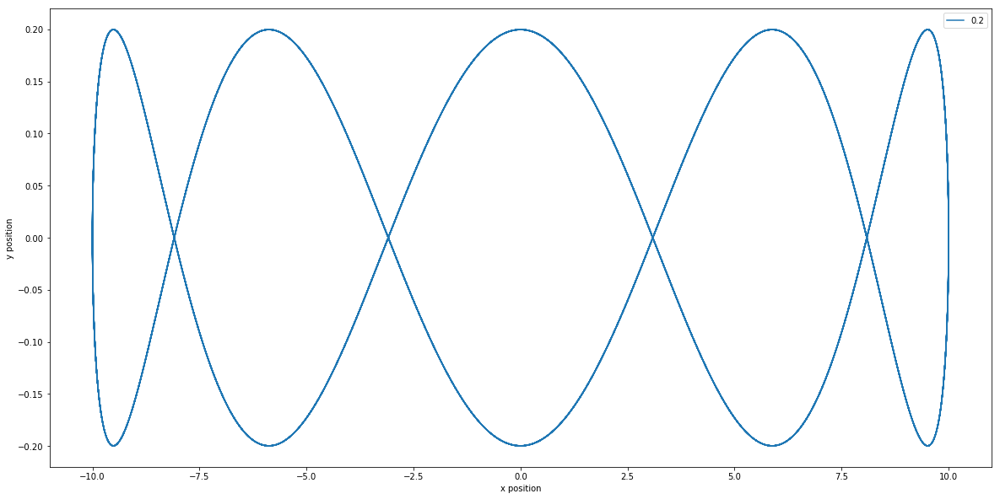

100%|██████████| 2500/2500 [00:00<00:00, 24339.64it/s]

4


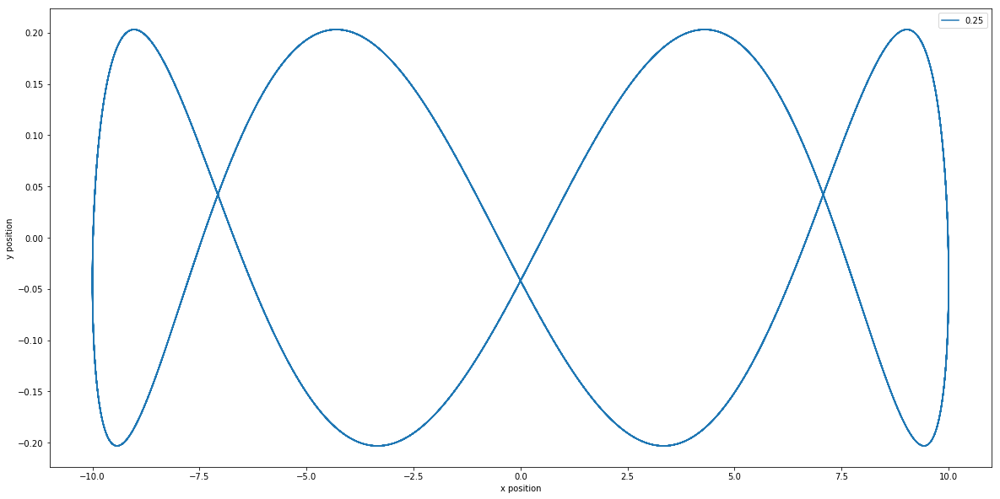

100%|██████████| 2500/2500 [00:00<00:00, 19265.24it/s]

3


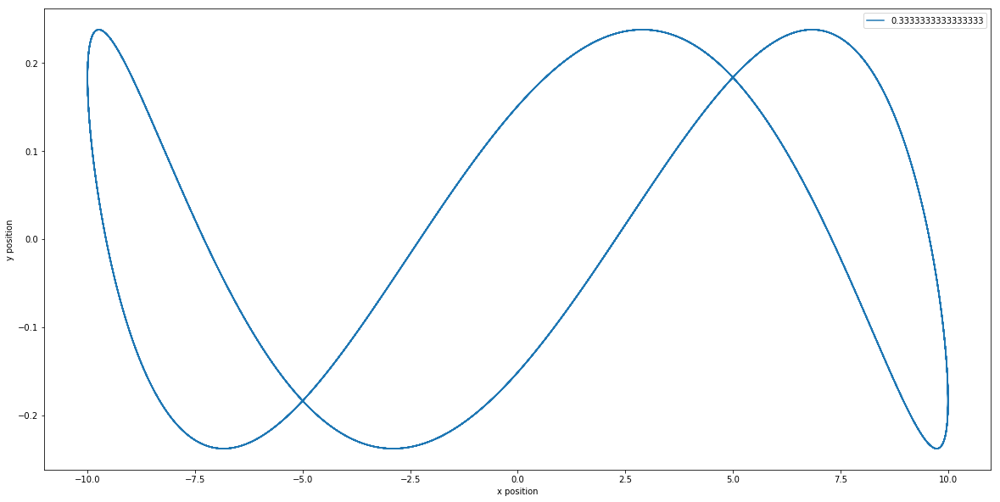

100%|██████████| 2500/2500 [00:00<00:00, 13613.31it/s]

2


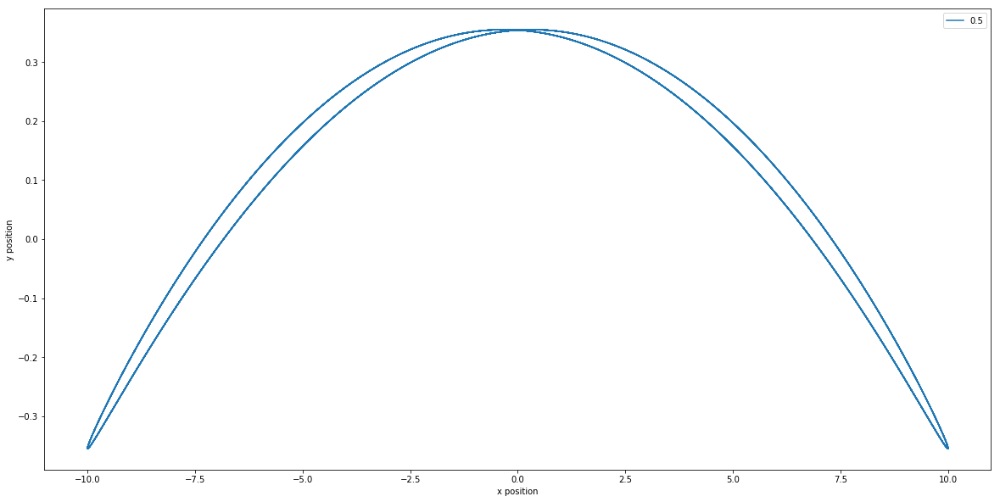

100%|██████████| 2500/2500 [00:00<00:00, 20786.48it/s]

1


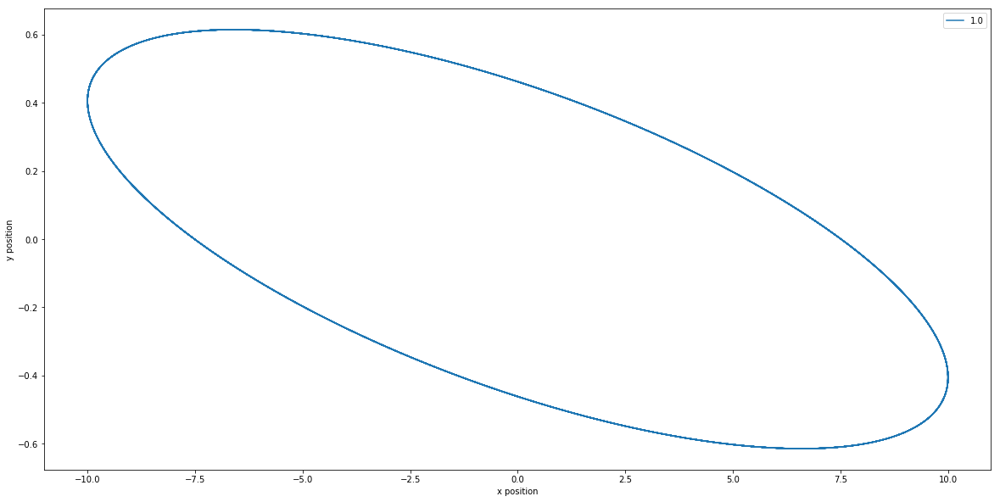

In [15]:
rx0 = 10
ry0 = 0
vx0 = 0
vy0 = 1
t = 0
h = 0.02
#components of k---------
m = 1
w1 = 1
w2 = 5
k1 = m*w1**2
k2 = m*w2**2
#------------------------

i0 = [rx0,ry0,vx0,vy0]

ta, xn, yn,vn = [],[],[],[]

lengthlist = np.linspace(0,50,50/h)
descend = 1
images = []

for i in np.linspace(0,5,5):
    ta, xn, yn,vn = [],[],[],[]

    print(w2)
    k2 = m*w2**2
        
    for t in tqdm(lengthlist):
    #while t < 50:
        ta.append(t)
        yn.append(i0[1]) #numerical position
        xn.append(i0[0])
        vn.append((i0[2]**2+i0[3]**2)**(1/2))

        #RK2
        i1 = RK4(spring, i0, t, h) #update y[n]

        for i in range(len(i1)): #reset y0 to the new vector
            i0[i] = i1[i]
        #t = t + h
        
    plt.figure(figsize=[20,10])
    plt.plot(xn,yn,label = w1/w2)
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.legend(loc=1)
    
    #update the omega and k values to make pretty loops!
    if w2 >= 5:
        w2 = 5
        descend = 1
    elif w2 <= 1:
        w2 = 1
        descend = 0

    if descend:
#        w2 = w2 - 0.02
        w2 = w2 - 1
    elif not descend:
#        w2 = w2 + 0.02
        w2 = w2 + 1
    
    ##This is the code used to make the MP4 below
    #plt.savefig('frame.png', bbox_inches='tight')
    #images.append(im.imread('frame.png'))
    #im.mimsave('movie3.mp4',images)
    
    plt.show()

From the plots above you can see that the number of vertically-oriented "lobes" in the curve is dependant on the denominator of the ratio of $\frac{k_{x}}{k_{y}}$. Should $k_{x}$ change as well, the number of horizontal lobes would increase, as seen below.

/home/soundofives/programs/lib/python3.6/site-packages/ipykernel_launcher.py:19: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
100%|██████████| 2500/2500 [00:00<00:00, 20744.12it/s]


1


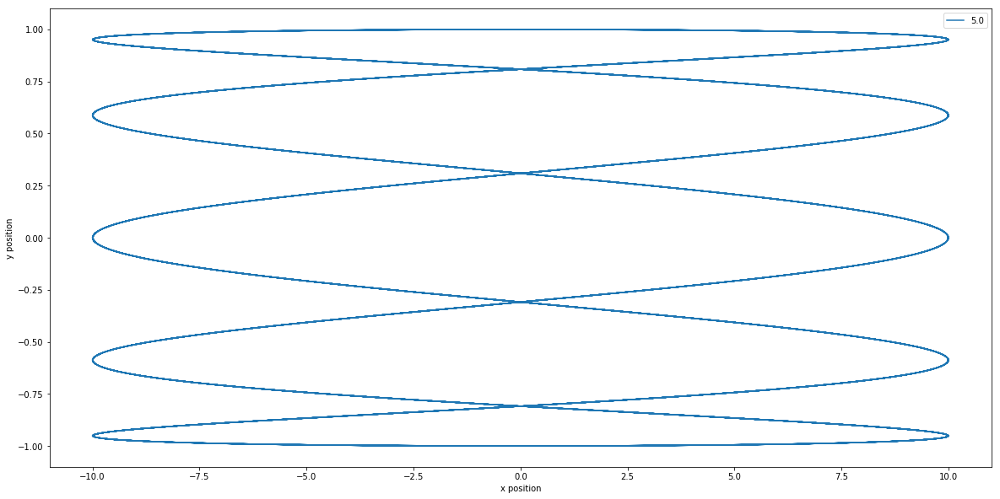

100%|██████████| 2500/2500 [00:00<00:00, 23337.11it/s]

1


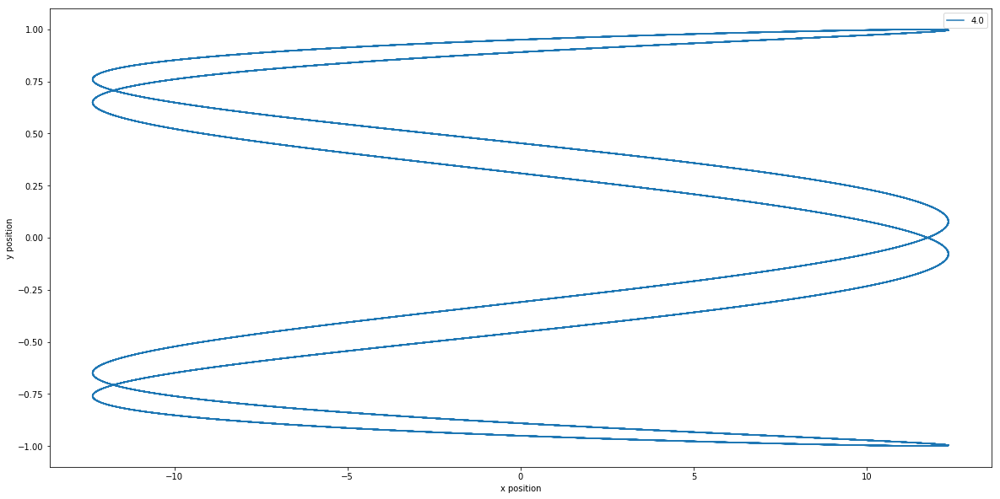

100%|██████████| 2500/2500 [00:00<00:00, 17210.37it/s]

1


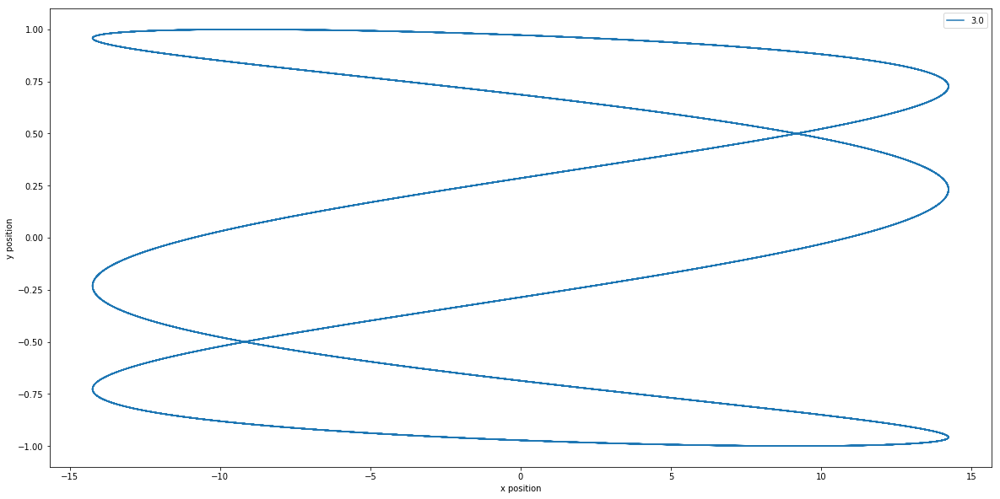

100%|██████████| 2500/2500 [00:00<00:00, 18587.69it/s]

1


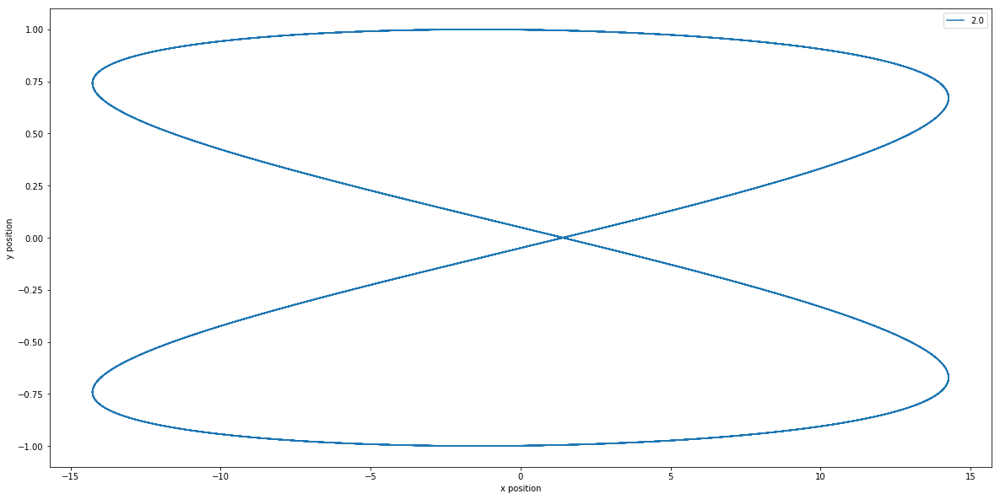

100%|██████████| 2500/2500 [00:00<00:00, 22149.89it/s]

1


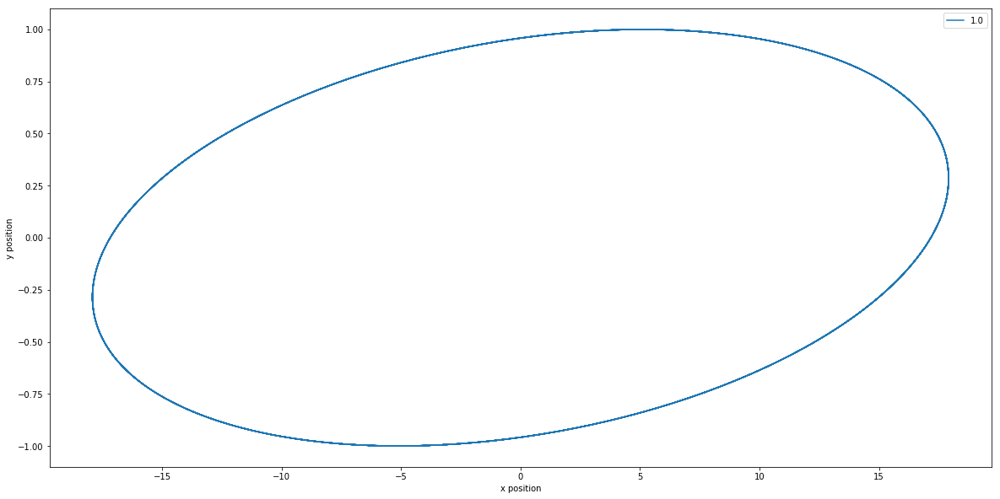

In [16]:
rx0 = 10
ry0 = 0
vx0 = 0
vy0 = 1
t = 0
h = 0.02
#components of k---------
m = 1
w1 = 5
w2 = 1
k1 = m*w1**2
k2 = m*w2**2
#------------------------

i0 = [rx0,ry0,vx0,vy0]

ta, xn, yn,vn = [],[],[],[]

lengthlist = np.linspace(0,50,50/h)
descend = 1
images = []

for i in np.linspace(0,5,5):
    ta, xn, yn,vn = [],[],[],[]

    print(w2)
    k1 = m*w1**2
        
    for t in tqdm(lengthlist):
    #while t < 50:
        ta.append(t)
        yn.append(i0[1]) #numerical position
        xn.append(i0[0])
        vn.append((i0[2]**2+i0[3]**2)**(1/2))

        #RK2
        i1 = RK4(spring, i0, t, h) #update y[n]

        for i in range(len(i1)): #reset y0 to the new vector
            i0[i] = i1[i]
        #t = t + h
        
    plt.figure(figsize=[20,10])
    plt.plot(xn,yn,label = w1/w2)
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.legend(loc=1)
    plt.show()
    
    #update the omega and k values to make pretty loops!
    if w1 >= 5:
        w1 = 5
        descend = 1
    elif w1 <= 1:
        w1 = 1
        descend = 0

    if descend:
#        w2 = w2 - 0.02
        w1 = w1 - 1
    elif not descend:
#        w2 = w2 + 0.02
        w1 = w1 + 1

If we set both $k_{x}$ and $k_{y}$ initally to values greater than one, but keep them such that $k_{x}$ - $k_{y}$ = 1, we get more complex curves:

/home/soundofives/programs/lib/python3.6/site-packages/ipykernel_launcher.py:19: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
100%|██████████| 2500/2500 [00:00<00:00, 20577.66it/s]


5


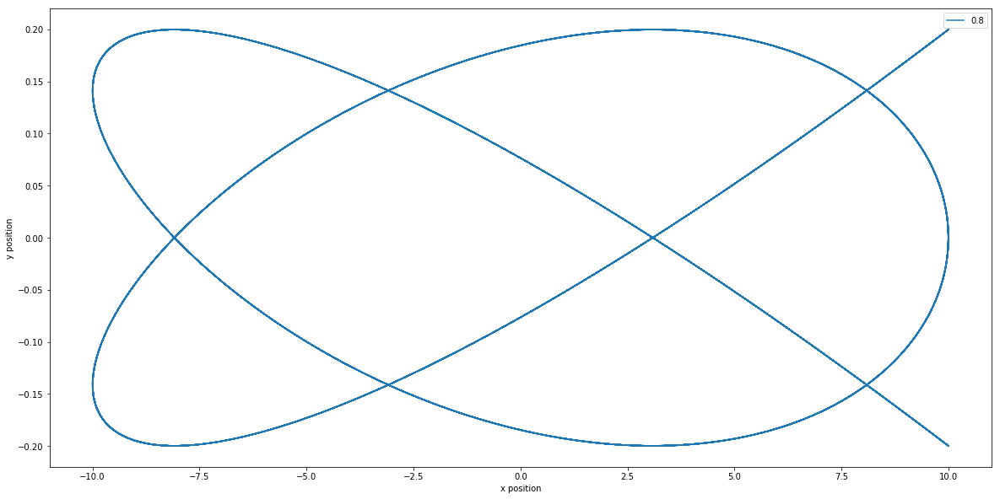

100%|██████████| 2500/2500 [00:00<00:00, 19811.40it/s]

4


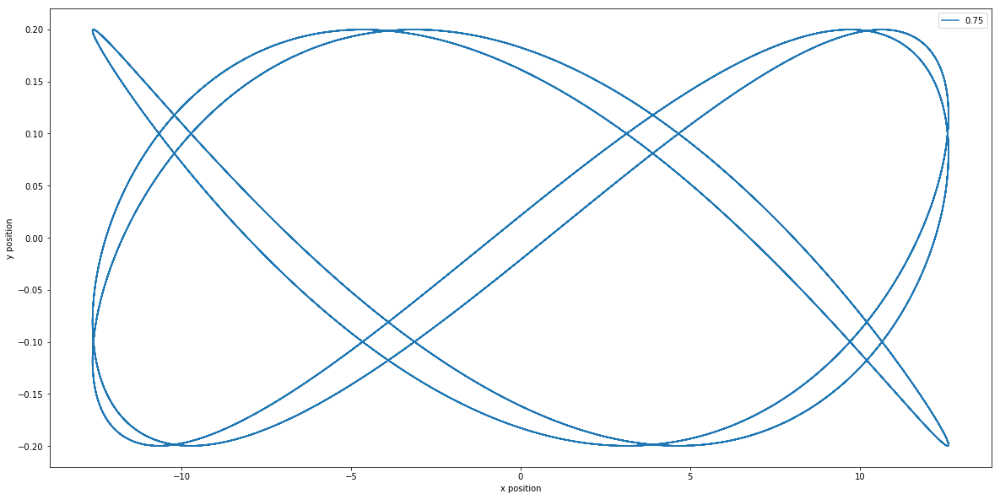

100%|██████████| 2500/2500 [00:00<00:00, 23434.01it/s]

3


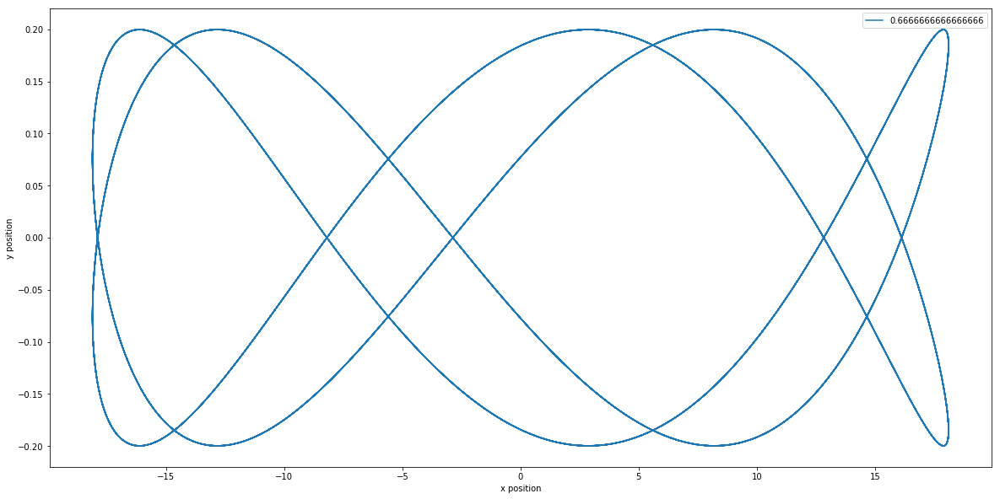

100%|██████████| 2500/2500 [00:00<00:00, 22741.29it/s]

2


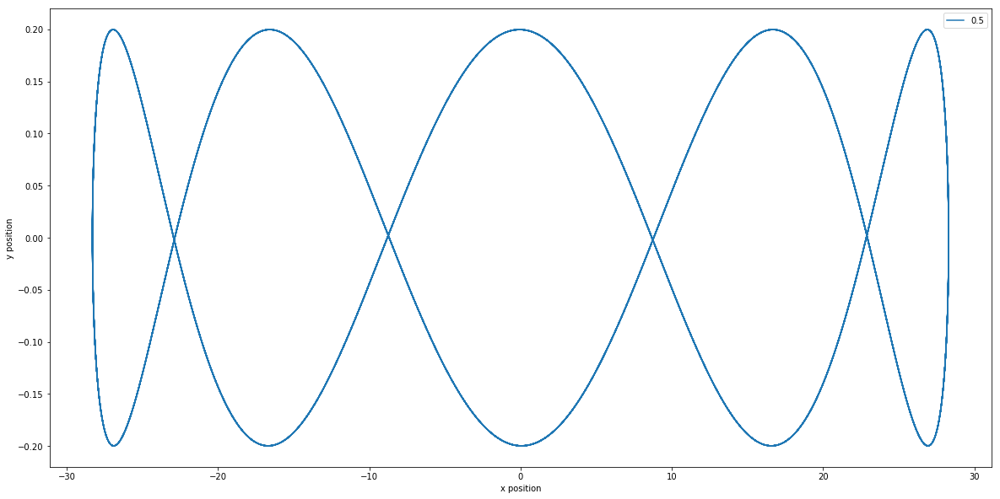

100%|██████████| 2500/2500 [00:00<00:00, 17634.15it/s]

2


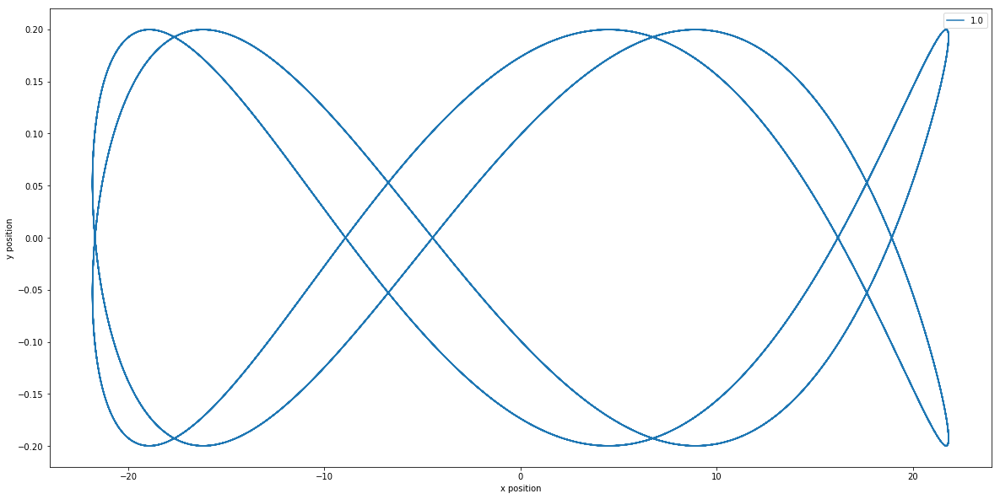

In [17]:
rx0 = 10
ry0 = 0
vx0 = 0
vy0 = 1
t = 0
h = 0.02
#components of k---------
m = 1
w1 = 4
w2 = 5
k1 = m*w1**2
k2 = m*w2**2
#------------------------

i0 = [rx0,ry0,vx0,vy0]

ta, xn, yn,vn = [],[],[],[]

lengthlist = np.linspace(0,50,50/h)
descend = 1
images = []

for i in np.linspace(0,5,5):
    ta, xn, yn,vn = [],[],[],[]

    print(w2)
    k1 = m*w1**2
        
    for t in tqdm(lengthlist):
    #while t < 50:
        ta.append(t)
        yn.append(i0[1]) #numerical position
        xn.append(i0[0])
        vn.append((i0[2]**2+i0[3]**2)**(1/2))

        #RK2
        i1 = RK4(spring, i0, t, h) #update y[n]

        for i in range(len(i1)): #reset y0 to the new vector
            i0[i] = i1[i]
        #t = t + h
        
    plt.figure(figsize=[20,10])
    plt.plot(xn,yn,label = w1/w2)
    plt.xlabel('x position')
    plt.ylabel('y position')
    plt.legend(loc=1)
    plt.show()
    
    #update the omega and k values to make pretty loops!
    if w1 >= 4:
        w1 = 4
        descend = 1
    elif w1 <= 1:
        w1 = 1
        descend = 0

    if descend:
#        w2 = w2 - 0.02
        w1 = w1 - 1
        w2 = w2 - 1
    elif not descend:
#        w2 = w2 + 0.02
        w1 = w1 + 1

## Video Compilation

Below is an mp4 video compiled from the plots in which $k_{y}$ decreased in relation to $k_{x}$

While it's difficult to spot the clean Lissajous curves, this shows how only specific ratios of $k_{x}$ to $k_{y}$ can produce the closed curves. All of the other ratios seem noisy in comparison.

In [6]:
filename2="movie.mp4"
video(filename2, filename2.split('.')[-1])


In [18]:
#If you are using Jupyter Notebook, the 3D plots below are easier seen with the ability to
#rotate the plot.

#%matplotlib notebook

## Lissajous Knots

The three dimentional representation of a Lissajous curve is called a Lissajous knot. The only difference is the addition of z-dimentional motion, though this creates a significantly more complex curve. For this, our system of equations expands to:

$F_{x} = \frac{1}{2}k_{x}x^2$

$F_{y} = \frac{1}{2}k_{y}y^2$

$F_{z} = \frac{1}{2}k_{z}z^2$

The three cells that follow show some examples of Lissajous knots. Initially, each $\omega_{n}$ is set to 1, and they are looped such that first the $\omega_{x}$ goes from 1 $\rightarrow$ 5, then $\omega_{y}$ loops from 0 $\rightarrow$ 5, then $\omega_{z}$ loops from 0 $\rightarrow$ 5. The relationship between each $\omega$ changes thusly:

$1:1:1$ ||
$2:1:1$ ||
$3:1:1$ ||
$4:1:1$ ||
$5:1:1$

$5:2:1$ ||
$5:3:1$ ||
$5:4:1$ ||
$5:5:1$

$5:5:2$ ||
$5:5:3$ ||
$5:5:4$ ||
$5:5:5$

/home/soundofives/programs/lib/python3.6/site-packages/ipykernel_launcher.py:37: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
100%|██████████| 1250/1250 [00:00<00:00, 13635.65it/s]


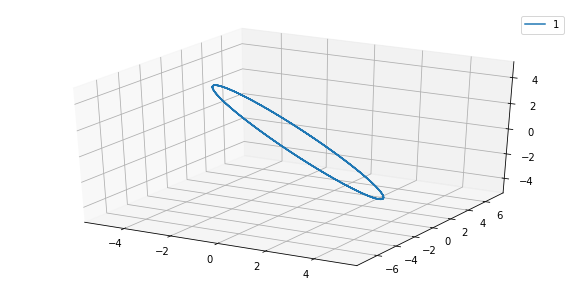

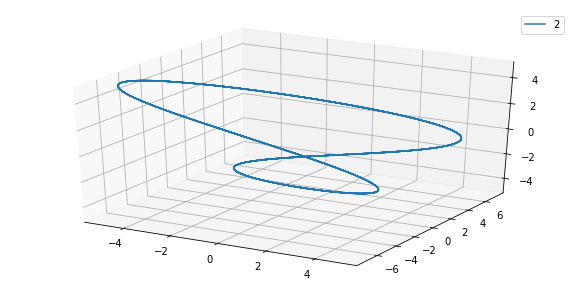

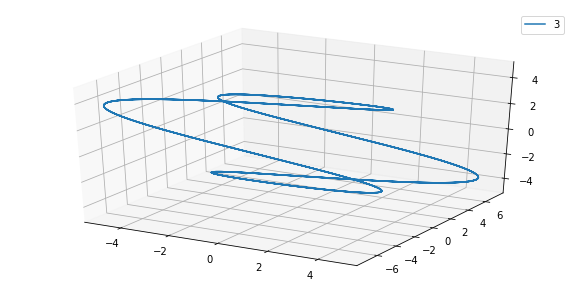

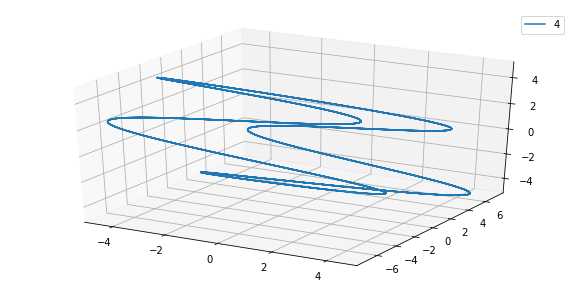

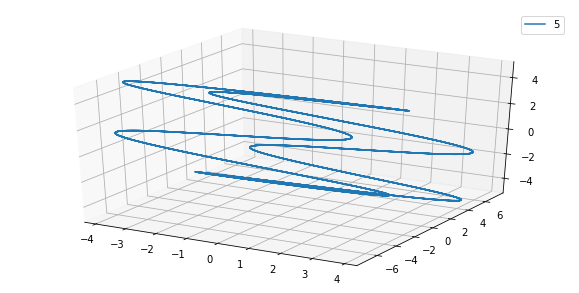

In [20]:
rx0 = 5
ry0 = -5
rz0 = 0
vx0 = 0
vy0 = -5
vz0 = 5
t = 0
h = 0.02
#components of k---------
m = 1
w1 = 1
w2 = 1
w3 = 1

k1 = m*w1**2
k2 = m*w2**2
k3 = m*w3**2
#------------------------

i0 = [rx0,ry0,rz0, vx0,vy0,vz0]

def spring3d(i0, t):
    didt = np.zeros(6) #initialize array; each element is a derivative of y [x,y,vx,vy]
    didt[0] = i0[3] # velocity; y[0] is position y[1] is dy/dt
    didt[1] = i0[4]
    didt[2] = i0[5]
    #didt[2] = -k*(i0[0]**2+i0[1]**2)**(1/2)*i0[0]
    didt[3] = -k1*i0[0]
    didt[4] = -k2*i0[1]
    didt[5] = -k3*i0[2]
    #didt[3] = -k*(i0[0]**2+i0[1]**2)**(1/2)*i0[1]

    return didt


ta, xn, yn,zn,vn = [],[],[],[],[]
lengthlist = np.linspace(0,25,25/h)
while w1 <= 5:
    ta, xn, yn,zn,vn = [],[],[],[],[]
    k1 = m*w1**2
    for t in tqdm(lengthlist):
        #while t < 50:
            ta.append(t)
            yn.append(i0[1]) #numerical position
            xn.append(i0[0])
            zn.append(i0[2])
            vn.append((i0[2]**2+i0[3]**2)**(1/2))

            #RK2
            i1 = RK4(spring3d, i0, t, h) #update y[n]

            for i in range(len(i1)): #reset y0 to the new vector
                i0[i] = i1[i]
            #t = t + h

        
    #fig=plt.figure(figsize=[10,5])
    #ax = fig.gca(projection='3d')
    #ax.plot_trisurf(xn,yn,zn,cmap='magma')
    #ax.legend(loc=1)

    fig2=plt.figure(figsize=[10,5])
    ax2 = fig2.gca(projection='3d')
    ax2.plot(xn,yn,zn,label=w1)
    ax2.legend(loc=1)
    w1 = w1+1


/home/soundofives/programs/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  
100%|██████████| 1250/1250 [00:00<00:00, 11997.60it/s]


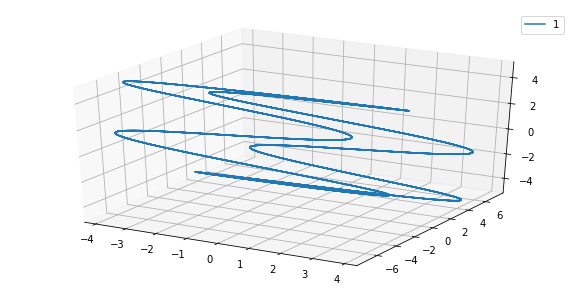

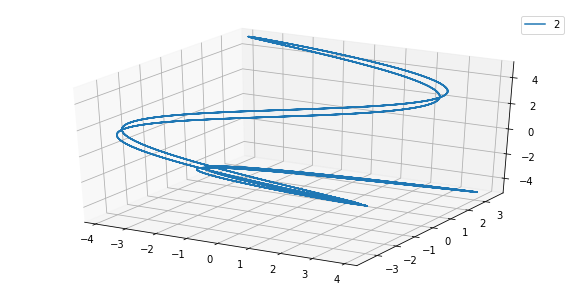

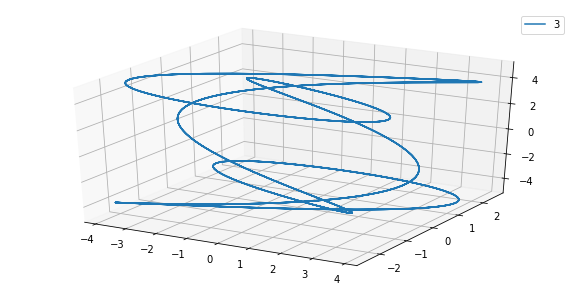

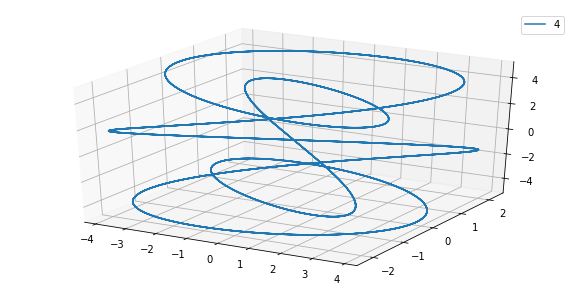

In [21]:
ta, xn, yn,zn,vn = [],[],[],[],[]
lengthlist = np.linspace(0,25,25/h)
while w2 < 5:
    ta, xn, yn,zn,vn = [],[],[],[],[]
    k2 = m*w2**2
    for t in tqdm(lengthlist):
        #while t < 50:
            ta.append(t)
            yn.append(i0[1]) #numerical position
            xn.append(i0[0])
            zn.append(i0[2])
            vn.append((i0[2]**2+i0[3]**2)**(1/2))

            #RK2
            i1 = RK4(spring3d, i0, t, h) #update y[n]

            for i in range(len(i1)): #reset y0 to the new vector
                i0[i] = i1[i]
            #t = t + h

        
    #fig=plt.figure(figsize=[10,5])
    #ax = fig.gca(projection='3d')
    #ax.plot_trisurf(xn,yn,zn,cmap='magma')
    #ax.legend(loc=1)

    fig2=plt.figure(figsize=[10,5])
    ax2 = fig2.gca(projection='3d')
    ax2.plot(xn,yn,zn,label=w2)
    ax2.legend(loc=1)
    w2 = w2+1


/home/soundofives/programs/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  
100%|██████████| 1250/1250 [00:00<00:00, 16418.58it/s]


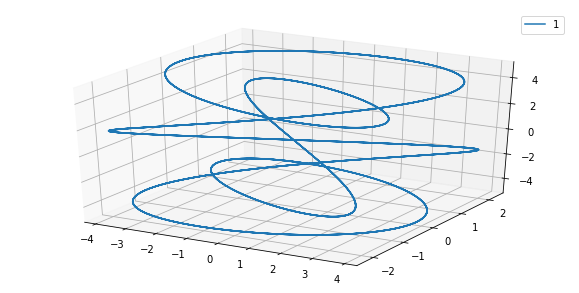

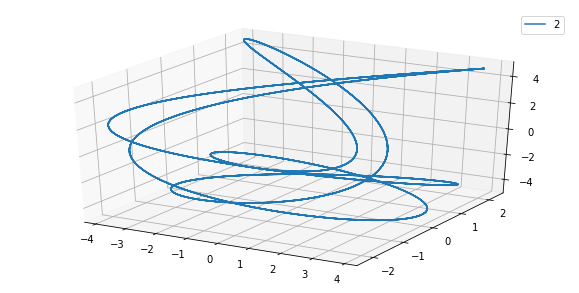

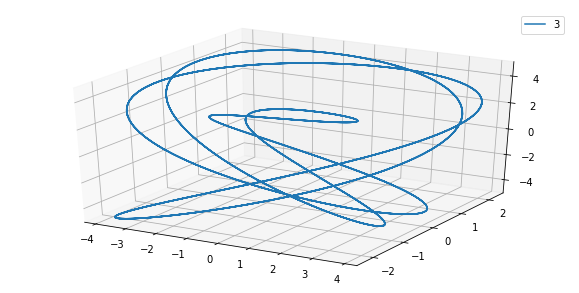

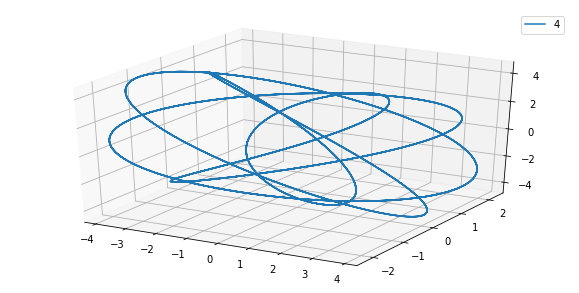

In [22]:
ta, xn, yn,zn,vn = [],[],[],[],[]
lengthlist = np.linspace(0,25,25/h)
while w3 < 5:
    ta, xn, yn,zn,vn = [],[],[],[],[]
    k3 = m*w3**2
    for t in tqdm(lengthlist):
        #while t < 50:
            ta.append(t)
            yn.append(i0[1]) #numerical position
            xn.append(i0[0])
            zn.append(i0[2])
            vn.append((i0[2]**2+i0[3]**2)**(1/2))

            #RK2
            i1 = RK4(spring3d, i0, t, h) #update y[n]

            for i in range(len(i1)): #reset y0 to the new vector
                i0[i] = i1[i]
            #t = t + h

        
    #fig=plt.figure(figsize=[10,5])
    #ax = fig.gca(projection='3d')
    #ax.plot_trisurf(xn,yn,zn,cmap='magma')
    #ax.legend(loc=1)

    fig2=plt.figure(figsize=[10,5])
    ax2 = fig2.gca(projection='3d')
    ax2.plot(xn,yn,zn,label=w3)
    ax2.legend(loc=1)
    w3 = w3+1
